<a href="https://colab.research.google.com/github/GopiMindgloer/Machine_Learning/blob/master/Twitter_Sentiment_Analysis_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Twitter Sentiment Analysis

In [0]:
#import dependencies
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from nltk.corpus import stopwords
import warnings 
warnings.filterwarnings("ignore", category=DeprecationWarning)
import string
import re

In [87]:
!pip install wordcloud

##**Importing data directly from Kaggle**

In [0]:
!pip install -q kaggle

In [0]:
#upload kaggle token 
from google.colab import files
files.upload()

In [4]:
#Checking of the file is uploaded
ls -lha kaggle.json

-rw-r--r-- 1 root root 68 Jan 29 10:51 kaggle.json


In [0]:
#creating a directory to put the json file and give it necessary permissions
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [0]:
#downloading the data directly from kaggle
!kaggle competitions download -c twitter-sentiment-analysis2

In [0]:
!unzip train.csv.zip

In [0]:
!jar xvf train.csv.zip

In [16]:
!ls

kaggle.json  sample_data  test.csv.zip	train.csv.zip


**I couldn't unzip the data due to some error in the file. So I will upload directly**

In [22]:
from google.colab import files
files.upload()

Saving train.csv (1).zip to train.csv (1).zip


{'train.csv (1).zip': b'PK\x03\x04\x14\x00\x00\x00\x08\x00\xcbrTM\x94\xf44}#>:\x00\xcf3\x84\x00\t\x00\x00\x00train.csv\xc4\xbd\xdb\x8e[[\x96%\xf6\xce\xafXq\x94Y!\xa9"\xa8 \xe3\xaa8HD0\xee\x94\xe2\xa2\nR\xd2Q\xa6\xb3\x0f6\xc9Mr+\xf6\x85g_\x82A\xa1\x90\xa8\x07\x03\xfd\xe0G\xdb\x0f\xed\'\x03\x86\xdb\x80\x1b~\xaf\x82\xd1h\xa0\xea\x0b\xfa\x0f\x12\xf5\x03\xfd\x0b\x1ec\xce\xb96)\xa5NU\xc30\xdc<\x99\x8a\x08\xee\xdb\xdak\xcd5\xafc\xce\xd9-\xc3\xa4{\xb6\xd1\x0b\xd32J\xf0\xcf\xf2\xb7~\xf8T6Z\x1b[\x1b\xee{\x9f\xa8pE\xe6\x8a`\xe4\xc6Y\xee\x92\x85\xeb\xbc\xbbv\xe3<\n\xd3Qs\xf5\xd3h\x7f\xff\x0e]\x97DE\x11\x8e\\9\r\xddm8w7Y\x96\xba2\x0f\xa28\xccy\xdd\xf6F\xeb\x9b\xeb\xb2d\xe2\xa2\xb2pA\x9c\x87\xc1h\xe1\xf6\x0f\xb7\xb7\xdc\xe1]c\xe7\xab\'4\x9b\xee.\x99\x04\x93\xa0\xe9\xba\t\xc6\x98e\x18l\xe2&U\x9a\x06\xee\xf4~\x81\xaf\xd7\x1fC7\x08\xc3\xd4\x05%\x1e\x8f7\x19\xf1\x9d\x8b\xd2\x15Q:\x0c]\xab\x85{t\xdd<\xc0+V\xb3\x8c\x83l\xbb\xcf\x15\x8eO\xc2\xd2\x05n\x98g\xf3\xd4\xcd\xaa\xd2a\xc4\xcf\xb7\xb7\x92(-^p\xc8\xb

In [25]:
!unzip 'train.csv (1).zip'

Archive:  train.csv (1).zip
  inflating: train.csv               


In [27]:
!ls

 kaggle.json   test.csv.zip  'train.csv (1).zip'
 sample_data   train.csv      train.csv.zip


In [35]:
from google.colab import files
files.upload()

Saving test.csv.zip to test.csv (1).zip


In [37]:
!unzip 'test.csv (1).zip'

Archive:  test.csv (1).zip
  inflating: test.csv                


##**Data Preprocessing :**

In [0]:
train = pd.read_csv('train.csv')

The above command didn't work because the default encoding is utf-8

In [0]:
train = pd.read_csv('train.csv', encoding='latin-1')

In [0]:
test = pd.read_csv('test.csv', encoding = 'latin-1')

In [53]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399978 entries, 0 to 399977
Data columns (total 3 columns):
ItemID           399978 non-null int64
Sentiment        99989 non-null float64
SentimentText    399978 non-null object
dtypes: float64(1), int64(1), object(1)
memory usage: 9.2+ MB


Since my test and train data has some identical data in common I'm gonna remove them the duplicates and concatenate the data into one.

In [0]:
dataset = pd.concat([train,test],ignore_index = True).drop_duplicates().reset_index(drop = True)

**From above its clear the we have to remove the unwanted punctuations, numbers and special characters since they reveal nothing about the sentiment**

In [0]:
#A program to remove the unwanted expressions
def remove_exp(input_text, pattern):
  item = re.findall(pattern, input_text)
  for i in item:
    input_text = re.sub(i,'',input_text)
  return input_text

In [0]:
dataset['Clean Tweet'] = dataset['SentimentText'].str.replace("[^a-zA-Z#]", " ")

In [55]:
dataset.head()

,ItemID,Sentiment,SentimentText,Clean Tweet
0,1,0.0,is so sad for my APL frie...,is so sad for my APL frie...
1,2,0.0,I missed the New Moon trail...,I missed the New Moon trail...
2,3,1.0,omg its already 7:30 :O,omg its already O
3,4,0.0,.. Omgaga. Im sooo im gunna CRy. I'...,Omgaga Im sooo im gunna CRy I ...
4,5,0.0,i think mi bf is cheating on me!!! ...,i think mi bf is cheating on me ...


**Now we have to remove stopwords since they are unnecessary.**

In [0]:
stop = stopwords.words('english')
dataset['Clean tweet'] = dataset['Clean Tweet'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))

In [83]:
dataset.head()

,ItemID,Sentiment,SentimentText,Clean Tweet,Clean tweet
0,1,0.0,is so sad for my APL frie...,is so sad for my APL frie...,sad APL friend
1,2,0.0,I missed the New Moon trail...,I missed the New Moon trail...,I missed New Moon trailer
2,3,1.0,omg its already 7:30 :O,omg its already O,omg already O
3,4,0.0,.. Omgaga. Im sooo im gunna CRy. I'...,Omgaga Im sooo im gunna CRy I ...,Omgaga Im sooo im gunna CRy I dentist since I ...
4,5,0.0,i think mi bf is cheating on me!!! ...,i think mi bf is cheating on me ...,think mi bf cheating T T


*Now we have to tokenize the data ie get individual words from the data**

In [84]:
tokenized_data = dataset['Clean tweet'].apply(lambda x: x.split())
tokenized_data.head()

0                                   [sad, APL, friend]
1                      [I, missed, New, Moon, trailer]
2                                    [omg, already, O]
3    [Omgaga, Im, sooo, im, gunna, CRy, I, dentist,...
4                      [think, mi, bf, cheating, T, T]
Name: Clean tweet, dtype: object

**Now we have to remove suffixes and prefixes from the tokenized words - stemming**

In [86]:
from nltk.stem.porter import *
stemmer = PorterStemmer()

tokenized_data = tokenized_data.apply(lambda x: [stemmer.stem(i) for i in x]) # stemming
tokenized_data.head()

0                                   [sad, apl, friend]
1                        [I, miss, new, moon, trailer]
2                                    [omg, alreadi, O]
3    [omgaga, Im, sooo, im, gunna, cri, I, dentist,...
4                         [think, mi, bf, cheat, T, T]
Name: Clean tweet, dtype: object

In [0]:
for i in range(len(tokenized_data)):
    tokenized_data[i] = ' '.join(tokenized_data[i])

dataset['Clean tweet'] = tokenized_data

##Visualization

In [0]:
words = ' '.join([text for text in dataset['Clean tweet']])

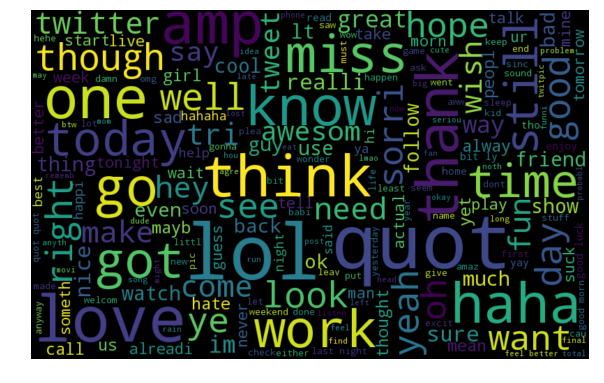

In [93]:
from wordcloud import WordCloud
wordcloud = WordCloud(width = 800,height = 500,random_state = 21,max_font_size = 110).generate(words)

plt.figure(figsize=(10,7))
plt.imshow(wordcloud,interpolation = 'bilinear')
plt.axis('off')
plt.show()


In [0]:
normal_words =' '.join([text for text in dataset['Clean tweet'][dataset['Sentiment'] == 0]])

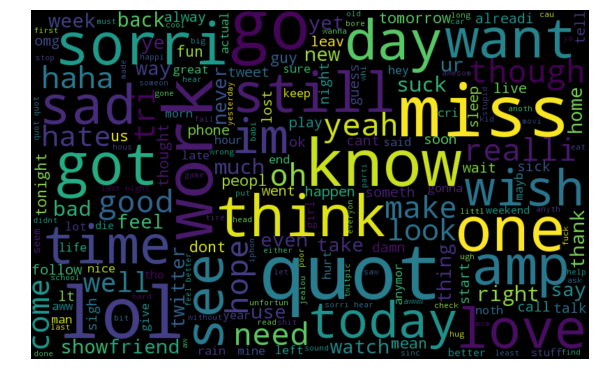

In [96]:
wordcloud = WordCloud(width = 800, height = 500,random_state = 21, max_font_size = 110).generate(normal_words)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud,interpolation = 'bilinear')
plt.axis('off')
plt.show()

In [0]:
negative_words = ' '.join(text for text in dataset['Clean tweet'][dataset['Sentiment'] == 1])

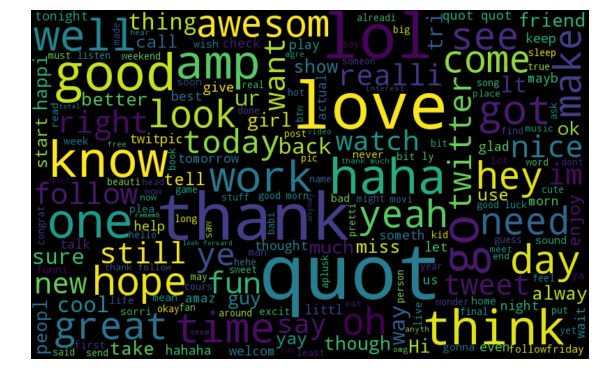

In [102]:
wordcloud = WordCloud(width = 800, height = 500, random_state = 21, max_font_size = 110).generate(negative_words)
plt.figure(figsize = (10,7))
plt.imshow(wordcloud,interpolation = 'bilinear')
plt.axis('off')
plt.show()

In [0]:
# function to collect hashtags
def hashtag_extract(x):
    hashtags = []
    # Loop over the words in the tweet
    for i in x:
        ht = re.findall(r"#(\w+)", i)
        hashtags.append(ht)

    return hashtags

In [0]:
# extracting hashtags from non racist/sexist tweets

HT_regular = hashtag_extract(dataset['Clean tweet'][dataset['Sentiment'] == 0])

# extracting hashtags from racist/sexist tweets
HT_negative = hashtag_extract(dataset['Clean tweet'][dataset['Sentiment'] == 1])

# unnesting list
HT_regular = sum(HT_regular,[])
HT_negative = sum(HT_negative,[])

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:1428: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


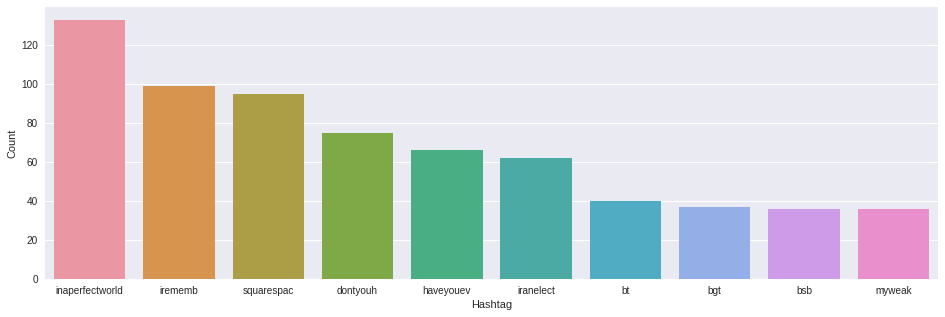

In [106]:
a = nltk.FreqDist(HT_regular)
d = pd.DataFrame({'Hashtag': list(a.keys()),
                  'Count': list(a.values())})
# selecting top 10 most frequent hashtags     
d = d.nlargest(columns="Count", n = 10) 
plt.figure(figsize=(16,5))
ax = sns.barplot(data=d, x= "Hashtag", y = "Count")
ax.set(ylabel = 'Count')
plt.show()